In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from bin import utils

In [2]:
umap_df = pd.read_csv('./Hatlas_umap_coordinates.csv', index_col=0)
umap_data = pd.read_csv('./Hatlas_umap_data.csv', sep=' ')
umap_data = umap_data.reset_index().set_index('level_0')
umap_data_tf = pd.read_csv('./Hatlas_umap_data_tf.csv', sep=' ')
umap_data_tf = umap_data_tf.reset_index().set_index('level_0')
umap_data_tf

,level_1,level_2,cell.type,TissueType,CancerType,batch,module11,module21,module31
level_0,,,,,,,,,
ACCAGAGTTATTAATG_Cell1,CD8_c3_Tn,Primary,tumor,tissue,AML,batch_level1_1,0.472611,-0.085104,-0.444457
ATTCCAGATGGCATCG_Cell2,CD8_c3_Tn,Primary,tumor,tissue,AML,batch_level1_1,-0.343657,-0.336331,-0.356274
AAGACTAGACCGCTAC_Cell3,CD8_c3_Tn,Primary,tumor,tissue,AML,batch_level1_1,-0.342771,-0.162157,-0.365291
CGCTGTAAAGTGAAAA_Cell4,CD8_c3_Tn,Primary,tumor,tissue,AML,batch_level1_1,-0.026036,0.015113,0.426849
TGCATCGTTCCTGGGT_Cell5,CD8_c3_Tn,Primary,tumor,tissue,AML,batch_level1_1,-0.225595,-0.351513,0.201941
...,...,...,...,...,...,...,...,...,...
AATACGGGCGTTCCTT_Cell110214,CD8_c3_Tn,Uninvolved,normal,tissue,Brain,batch_level1_12,-0.117669,0.481218,1.132725
CGCAGTACTCTCTCGT_Cell110215,CD8_c3_Tn,Uninvolved,normal,tissue,Brain,batch_level1_12,0.176103,0.443280,1.176559
GGGTGCCTAGAGTTGT_Cell110216,CD8_c3_Tn,Uninvolved,normal,tissue,Brain,batch_level1_12,-0.440540,0.053065,1.128365


In [3]:
umap_df

,UMAP_1,UMAP_2
ACCAGAGTTATTAATG_Cell1,7.228569,2.438074
ATTCCAGATGGCATCG_Cell2,7.100571,2.609671
AAGACTAGACCGCTAC_Cell3,7.197518,2.646933
CGCTGTAAAGTGAAAA_Cell4,7.207912,2.745117
TGCATCGTTCCTGGGT_Cell5,7.134978,3.013728
...,...,...
AATACGGGCGTTCCTT_Cell110214,6.748876,1.245744
CGCAGTACTCTCTCGT_Cell110215,6.875129,1.336188
GGGTGCCTAGAGTTGT_Cell110216,7.183241,2.520386
CCCGCCCATAGTGCCG_Cell110217,-0.325771,-1.015793


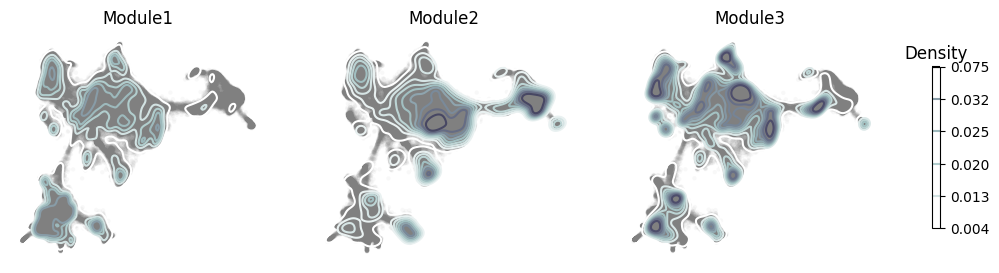

In [4]:
fig, ax = plt.subplots(1, 3, figsize=(14, 3))

# 统一colorbar的cmap
common_cmap = 'bone_r'

kde1 = sns.kdeplot(x=umap_df['UMAP_1'], y=umap_df['UMAP_2'], weights=umap_data['module11'].map(lambda x: 0 if x < 0 else x),
                   ax=ax[0], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False, levels=6)
sns.scatterplot(x=umap_df['UMAP_1'],
                y=umap_df['UMAP_2'],
                ax=ax[0], color='gray', alpha=0.05, s=10, edgecolor='none')

kde2 = sns.kdeplot(x=umap_df['UMAP_1'], y=umap_df['UMAP_2'], weights=umap_data['module21'].map(lambda x: 0 if x < 0 else x),
                   ax=ax[1], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=umap_df['UMAP_1'],
                y=umap_df['UMAP_2'],
                ax=ax[1], color='gray', alpha=0.05, s=10, edgecolor='none')


kde3 = sns.kdeplot(x=umap_df['UMAP_1'], y=umap_df['UMAP_2'], weights=umap_data['module31'].map(lambda x: 0 if x < 0 else x),
                   ax=ax[2], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=umap_df['UMAP_1'],
                y=umap_df['UMAP_2'],
                ax=ax[2], color='gray', alpha=0.05, s=10, edgecolor='none')

# 统一colorbar
cbar = fig.colorbar(kde1.collections[0], ax=ax, orientation='vertical', shrink=0.7)
cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))
cbar.ax.set_title('Density')

sns.despine(left=True, bottom=True, ax=fig.get_axes()[0])
fig.get_axes()[0].set_xlabel('')
fig.get_axes()[0].set_ylabel('')
fig.get_axes()[0].set_title('Module1')
fig.get_axes()[0].set_xticks([])
fig.get_axes()[0].set_yticks([])

sns.despine(left=True, bottom=True, ax=fig.get_axes()[1])
fig.get_axes()[1].set_xlabel('')
fig.get_axes()[1].set_ylabel('')
fig.get_axes()[1].set_title('Module2')
fig.get_axes()[1].set_xticks([])
fig.get_axes()[1].set_yticks([])

sns.despine(left=True, bottom=True, ax=fig.get_axes()[2])
fig.get_axes()[2].set_xlabel('')
fig.get_axes()[2].set_ylabel('')
fig.get_axes()[2].set_title('Module3')
fig.get_axes()[2].set_xticks([])
fig.get_axes()[2].set_yticks([])

plt.rcParams['pdf.fonttype'] = 42
fig.savefig('./plots/umap_density_human.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

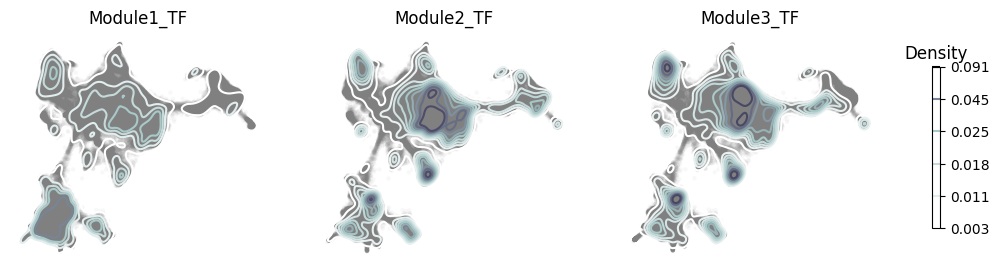

In [5]:
fig, ax = plt.subplots(1, 3, figsize=(14, 3))

# 统一colorbar的cmap
common_cmap = 'bone_r'

kde1 = sns.kdeplot(x=umap_df['UMAP_1'], y=umap_df['UMAP_2'], weights=umap_data_tf['module11'].map(lambda x: 0 if x < 0 else x),
                   ax=ax[0], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False, levels=6)
sns.scatterplot(x=umap_df['UMAP_1'],
                y=umap_df['UMAP_2'],
                ax=ax[0], color='gray', alpha=0.05, s=10, edgecolor='none')

kde2 = sns.kdeplot(x=umap_df['UMAP_1'], y=umap_df['UMAP_2'], weights=umap_data_tf['module21'].map(lambda x: 0 if x < 0 else x),
                   ax=ax[1], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=umap_df['UMAP_1'],
                y=umap_df['UMAP_2'],
                ax=ax[1], color='gray', alpha=0.05, s=10, edgecolor='none')


kde3 = sns.kdeplot(x=umap_df['UMAP_1'], y=umap_df['UMAP_2'], weights=umap_data_tf['module31'].map(lambda x: 0 if x < 0 else x),
                   ax=ax[2], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=umap_df['UMAP_1'],
                y=umap_df['UMAP_2'],
                ax=ax[2], color='gray', alpha=0.05, s=10, edgecolor='none')

# 统一colorbar
cbar = fig.colorbar(kde1.collections[0], ax=ax, orientation='vertical', shrink=0.7)
cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))
cbar.ax.set_title('Density')

sns.despine(left=True, bottom=True, ax=fig.get_axes()[0])
fig.get_axes()[0].set_xlabel('')
fig.get_axes()[0].set_ylabel('')
fig.get_axes()[0].set_title('Module1_TF')
fig.get_axes()[0].set_xticks([])
fig.get_axes()[0].set_yticks([])

sns.despine(left=True, bottom=True, ax=fig.get_axes()[1])
fig.get_axes()[1].set_xlabel('')
fig.get_axes()[1].set_ylabel('')
fig.get_axes()[1].set_title('Module2_TF')
fig.get_axes()[1].set_xticks([])
fig.get_axes()[1].set_yticks([])

sns.despine(left=True, bottom=True, ax=fig.get_axes()[2])
fig.get_axes()[2].set_xlabel('')
fig.get_axes()[2].set_ylabel('')
fig.get_axes()[2].set_title('Module3_TF')
fig.get_axes()[2].set_xticks([])
fig.get_axes()[2].set_yticks([])

plt.rcParams['pdf.fonttype'] = 42
fig.savefig('./plots/umap_density_human_tf.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

In [7]:
scdata = sc.read_h5ad('./RNA/sc.combined.dedup.clustered.h5')
# scdata = sc.read_h5ad('/home/wpy/stereoseq/20240702-Exclusive/RNA/sc.reclustered.h5')
# scdata = scdata[~scdata.obs['leiden'].isna()].copy()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


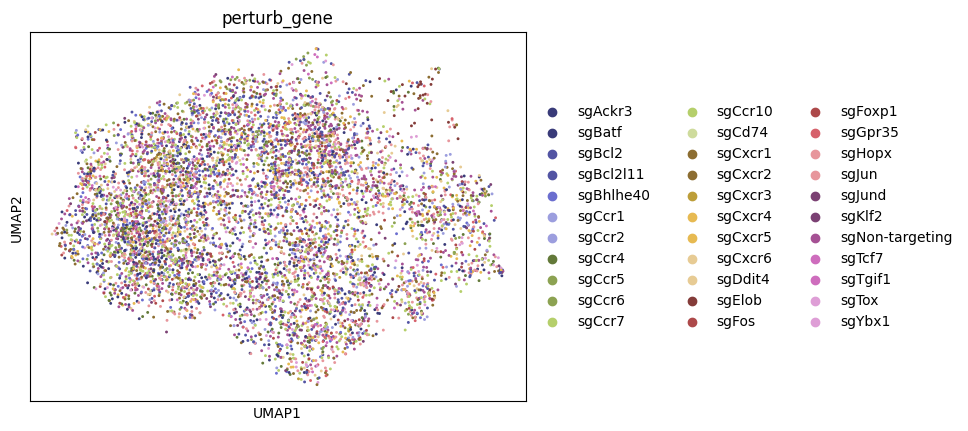

In [8]:
sc.pl.umap(scdata[scdata.obs.perturb_gene != 'Duplicate'], color=['perturb_gene'], palette='tab20b', return_fig=False)

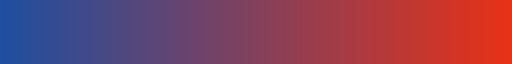

In [3]:
from types import new_class
from matplotlib.colors import LinearSegmentedColormap

colors = ['#1f4fa1', '#ffffff', '#e83217']
colors = ['#1f4fa1', '#e83217']
n_bins = 256
new_cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=n_bins)
new_cmap

In [5]:
scdata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,n_genes,perturb,perturb_gene,leiden,phenotype
AAACCTGAGAGACGAA-1,1071,6.977281,2452.0,7.805067,36.582382,46.044046,58.401305,76.712887,1071,sgBatf_2,sgBatf,3,Tem
AAACCTGAGCTTATCG-1,1499,7.313220,4590.0,8.431853,38.671024,47.930283,59.215686,75.925926,1499,Duplicate,Duplicate,3,Tem
AAACCTGAGTACTTGC-1,1218,7.105786,2606.0,7.865955,33.154259,42.402149,53.683807,72.448196,1218,sgBhlhe40_1,sgBhlhe40,8,Tpex
AAACCTGAGTATCGAA-1,1237,7.121252,2638.0,7.878155,26.080364,36.429113,49.772555,72.062168,1237,Duplicate,Duplicate,8,Tpex
AAACCTGAGTGGGTTG-1,1480,7.300473,3904.0,8.270013,28.278689,38.703893,51.178279,71.465164,1480,Duplicate,Duplicate,1,Trm
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTAAGTGGC-1,949,6.856462,2003.0,7.602901,31.352971,42.486271,56.315527,77.583625,949,Duplicate,Duplicate,4,Tex
TTTGTCAGTCATTAGC-1,1156,7.053586,3096.0,8.038189,36.660207,47.609819,60.271318,78.811370,1156,Duplicate,Duplicate,2,Teff
TTTGTCAGTCGCCATG-1,888,6.790097,1896.0,7.548029,36.814346,48.154008,60.654008,79.535865,888,Duplicate,Duplicate,4,Tex
TTTGTCATCCGTCATC-1,1393,7.239933,3138.0,8.051660,27.246654,36.775016,49.171447,70.841300,1393,Duplicate,Duplicate,6,Teff


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


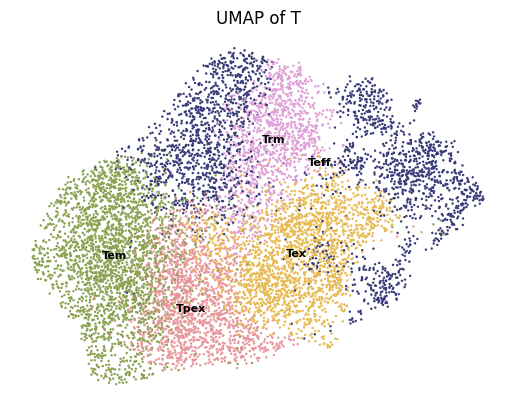

In [6]:
plot_data = scdata.copy()
ax = sc.pl.umap(plot_data, color=['phenotype'], palette='tab20b', return_fig=True,
legend_loc='on data', legend_fontsize=8).gca()
ax.set_title('UMAP T subtype')

sns.despine(left=True, bottom=True)
plt.xlabel('')
plt.ylabel('')
plt.title('UMAP of T')

# plt.rcParams['pdf.fonttype'] = 42
# plt.savefig('./plots/umap_t_subtype.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for

<Figure size 800x300 with 0 Axes>

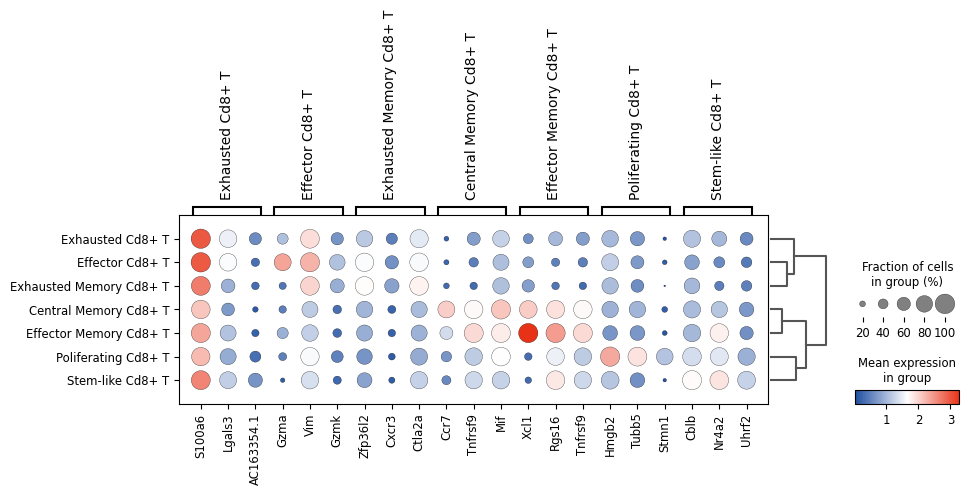

In [5]:
sc.tl.rank_genes_groups(scdata, groupby='leiden', method='t-test')

plt.figure(figsize=(8, 3))
fig = sc.pl.rank_genes_groups_dotplot(scdata, n_genes=3, cmap=new_cmap, return_fig=True)

fig.savefig('./plots/dotplot_t_subtype.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

In [4]:
sc.tl.embedding_density(scdata, basis='umap', groupby='perturb_gene')

# Chemokine Receptor <-> Phenotype

In [16]:
scdata

AnnData object with n_obs × n_vars = 9887 × 12481
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes', 'perturb', 'perturb_gene', 'leiden', 'phenotype'
    var: 'feature_types', 'mt', 'mt-', 'gm', 'Rb', 'rik', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'dendrogram_phenotype', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'phenotype_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

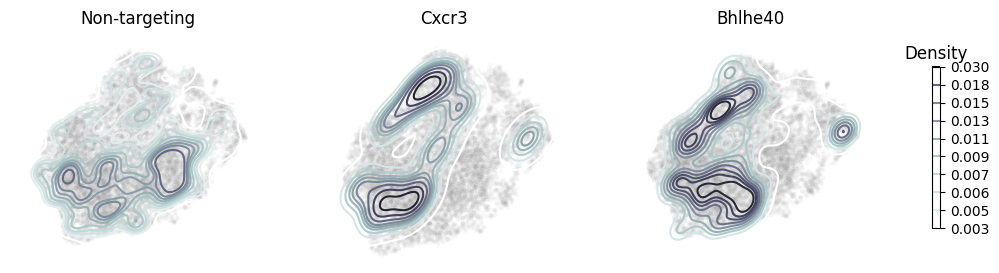

In [28]:
# chemokine_list = ["sgCcr1", "sgCcr2", "sgCcr4", "sgCcr5", "sgCcr6",
#     "sgCcr7", "sgCcr10", "sgCxcr1", "sgCxcr2", "sgCxcr3", "sgCxcr4",
#     "sgAckr3", "sgCxcr5", "sgCxcr6", "sgCd74", "sgGpr35", 'sgNon-targeting']
TF_list = ['sgBhlhe40', 'sgNon-targeting', 'sgCxcr3']
# fig = sc.pl.embedding_density(scdata, basis='umap', key='umap_density_perturb_gene', group=TF_list, return_fig=True)
fig, ax = plt.subplots(1, 3, figsize=(14, 3))

# 统一colorbar的cmap
common_cmap = 'bone_r'

kde1 = sns.kdeplot(x=scdata.obsm['X_umap'][:, 0][scdata.obs['perturb_gene'] == 'sgNon-targeting'],
                   y=scdata.obsm['X_umap'][:, 1][scdata.obs['perturb_gene'] == 'sgNon-targeting'],
                   ax=ax[0], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=scdata.obsm['X_umap'][:, 0],
                y=scdata.obsm['X_umap'][:, 1],
                ax=ax[0], color='gray', alpha=0.05, s=10, edgecolor='none')

kde2 = sns.kdeplot(x=scdata.obsm['X_umap'][:, 0][scdata.obs['perturb_gene'] == 'sgCxcr3'],
                   y=scdata.obsm['X_umap'][:, 1][scdata.obs['perturb_gene'] == 'sgCxcr3'],
                   ax=ax[1], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=scdata.obsm['X_umap'][:, 0],
                y=scdata.obsm['X_umap'][:, 1],
                ax=ax[1], color='gray', alpha=0.05, s=10, edgecolor='none')

kde3 = sns.kdeplot(x=scdata.obsm['X_umap'][:, 0][scdata.obs['perturb_gene'] == 'sgBhlhe40'],
                   y=scdata.obsm['X_umap'][:, 1][scdata.obs['perturb_gene'] == 'sgBhlhe40'],
                   ax=ax[2], cmap=common_cmap, alpha=1, bw_adjust=0.5, fill=False)
sns.scatterplot(x=scdata.obsm['X_umap'][:, 0],
                y=scdata.obsm['X_umap'][:, 1],
                ax=ax[2], color='gray', alpha=0.05, s=10, edgecolor='none')

# 统一colorbar
cbar = fig.colorbar(kde1.collections[0], ax=ax, orientation='vertical', shrink=0.7)
cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.3f}'))
cbar.ax.set_title('Density')

sns.despine(left=True, bottom=True, ax=fig.get_axes()[0])
fig.get_axes()[0].set_xlabel('')
fig.get_axes()[0].set_ylabel('')
fig.get_axes()[0].set_title('Non-targeting')
fig.get_axes()[0].set_xticks([])
fig.get_axes()[0].set_yticks([])

sns.despine(left=True, bottom=True, ax=fig.get_axes()[1])
fig.get_axes()[1].set_xlabel('')
fig.get_axes()[1].set_ylabel('')
fig.get_axes()[1].set_title('Cxcr3')
fig.get_axes()[1].set_xticks([])
fig.get_axes()[1].set_yticks([])

sns.despine(left=True, bottom=True, ax=fig.get_axes()[2])
fig.get_axes()[2].set_xlabel('')
fig.get_axes()[2].set_ylabel('')
fig.get_axes()[2].set_title('Bhlhe40')
fig.get_axes()[2].set_xticks([])
fig.get_axes()[2].set_yticks([])
fig.savefig('./plots/umap_density_Bhlhe40.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

/tmp/ipykernel_73375/1057254717.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cdf = chem_data.obs.groupby('perturb_gene')['leiden'].value_counts().unstack()


<Figure size 1200x600 with 0 Axes>

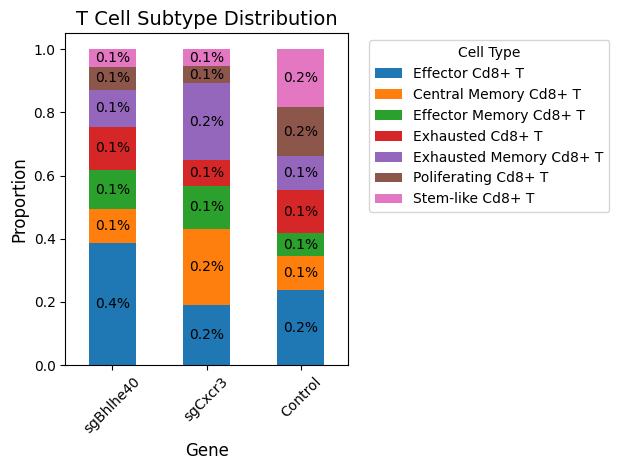

In [6]:
TF_list = ['sgBhlhe40', 'sgNon-targeting', 'sgCxcr3']

chem_data = scdata[np.isin(scdata.obs.perturb_gene, TF_list)].copy()
cdf = chem_data.obs.groupby('perturb_gene')['leiden'].value_counts().unstack()
cdf = cdf.divide(cdf.sum(axis=1), axis=0)
cdf = cdf[['Effector Cd8+ T'] + list(cdf.columns[cdf.columns != 'Effector Cd8+ T'])]
cdf.index = cdf.index.str.replace('sgNon-targeting', 'Control')

# 使用堆叠条形图展示基因和细胞类型之间的关系
import matplotlib.pyplot as plt
import seaborn as sns

# 设置图形大小
plt.figure(figsize=(12, 6))

# 绘制堆叠条形图
ax = cdf.plot(kind='bar', stacked=True)

# 自定义图形
plt.title('T Cell Subtype Distribution', fontsize=14)
plt.xlabel('Gene', fontsize=12)
plt.ylabel('Proportion', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# 添加百分比标签
for c in ax.containers:
    ax.bar_label(c, fmt='%.1f%%', label_type='center')

# 调整布局
plt.tight_layout()

# 保存图形
plt.savefig('./plots/cell_type_distribution.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

In [66]:
plot_data.obs.phenotype.unique()

['Tem', 'Tpex', 'Tex', 'Trm', 'Teff']
Categories (5, object): ['Teff', 'Tem', 'Tex', 'Tpex', 'Trm']

In [4]:
import plotly.graph_objects as go

# 示例数据
plot_data = scdata[scdata.obs.perturb_gene != 'Duplicate']
# plot_data.obs['phenotype'] = plot_data.obs['phenotype'].map({
#     'c1': 'Effector CD8+ T',
#     'c2': 'Stem-like CD8+ T',
#     'c3': 'Exhausted CD8+ T',
#     'c4': 'Memory CD8+ T'
# })

data = plot_data.obs[["perturb_gene", "phenotype"]]
data.columns = ["perturb_gene", "cluster"]

df = pd.DataFrame(data)

# 计算流量值（在这里，每个组合的频率）
flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')

# 创建源、目标和值的列表
source_indices = []
target_indices = []
values = []

# 自定义perturb_gene的顺序
chemokine_list = ["sgCcr1", "sgCcr2", "sgCcr4", "sgCcr5", "sgCcr6",
    "sgCcr7", "sgCcr10", "sgCxcr1", "sgCxcr2", "sgCxcr3", "sgCxcr4",
    "sgAckr3", "sgCxcr5", "sgCxcr6", "sgCd74", "sgGpr35"]
tf_list = list(set(flows['perturb_gene'].unique()) - set(chemokine_list) - set(['sgNon-targeting']))
gene_order = tf_list + ['sgNon-targeting'] + chemokine_list
# 过滤出实际存在的基因
unique_genes = [gene for gene in gene_order if gene in flows['perturb_gene'].unique()]
unique_clusters = flows['cluster'].unique()

# 创建索引映射
gene_indices = {gene: idx for idx, gene in enumerate(unique_genes)}
cluster_indices = {cluster: idx + len(unique_genes) for idx, cluster in enumerate(unique_clusters)}

# 构建源、目标和值列表
for index, row in flows.iterrows():
    source_indices.append(gene_indices[row['perturb_gene']])
    target_indices.append(cluster_indices[row['cluster']])
    values.append(row['count'])

# 计算每个perturb_gene的流量总和
total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()

# 计算每个perturb_gene的流量占比
flows['total_gene_flow'] = flows['perturb_gene'].map(total_flows_per_gene)
flows.total_gene_flow = flows.total_gene_flow.astype(int)
flows['color_intensity'] = flows['count'] / flows['total_gene_flow']

# 创建颜色映射
import matplotlib.cm as cm
# colors = [cm.RdBu_r(2.5*x) for x in flows['color_intensity']]
colors = [new_cmap(2*x) for x in flows['color_intensity']]
    
# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_genes) + list(unique_clusters),
        color=['Royalblue' if x in chemokine_list else \
               ('Tomato' if x in tf_list else ('Lightgray' if x == 'sgNon-targeting' else 'wheat')) for x in unique_genes] +
               ['Lightblue' if x == 'Effector CD8+ T' else 'Lightgreen' if x == 'Stem-like CD8+ T' else 'Lightcoral' if x == 'Exhausted CD8+ T' else 'Lightpink' if x == 'Memory CD8+ T' else 'Lightgray' for x in unique_clusters]
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=[f"rgba({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)}, 0.7)" for color in colors],
    )
)])

# 更新布局
fig.update_layout(title_text="Sankey Diagram of perturb_gene to cluster", font_size=10)
fig.update_layout(
    width=600,  # 设置宽度
    height=1200,  # 设置高度
)
# fig.savefig('./plots/sankey_perturb_gene_to_cluster.pdf', dpi=300, format='pdf', bbox_inches='tight')
# 使用plotly的io模块保存为pdf
# import plotly.io as pio
# pio.write_image(fig, './plots/sankey_perturb_gene_to_cluster.pdf', format='pdf', width=600, height=1200)
fig.write_image('./plots/sankey_perturb_gene_to_cluster.pdf', format='pdf', width=600, height=1200)

fig.show()

/tmp/ipykernel_29855/3346509603.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')
/tmp/ipykernel_29855/3346509603.py:46: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()


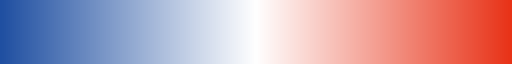

In [6]:
from types import new_class
from matplotlib.colors import LinearSegmentedColormap

colors = ['#1f4fa1', '#ffffff', '#e83217']
# colors = ['#1f4fa1', '#e83217']
n_bins = 256
new_cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=n_bins)
new_cmap

In [9]:
plot_data = scdata[scdata.obs.perturb_gene != 'Duplicate']

data = plot_data.obs[["perturb_gene", "phenotype"]]
data.columns = ["perturb_gene", "cluster"]

df = pd.DataFrame(data)
df = df.groupby(['perturb_gene', 'cluster']).value_counts().unstack()
df = df.divide(df.sum(axis=1), axis=0)

df = df.divide(df.loc['sgNon-targeting'], axis=1)
df = np.log2(df + 1e-6)

chemokine_list = ["sgCcr1", "sgCcr2", "sgCcr4", "sgCcr5", "sgCcr6",
    "sgCcr7", "sgCcr10", "sgCxcr1", "sgCxcr2", "sgCxcr3", "sgCxcr4",
    "sgAckr3", "sgCxcr5", "sgCxcr6", "sgCd74", "sgGpr35"]

plt.figure(figsize=(1.2, 6))
# sns.heatmap(df, cmap=new_cmap, linewidths=0.5, linecolor='black', vmin=-1, vmax=1)
sns.clustermap(df[df.index.isin(chemokine_list)], cmap=new_cmap, linewidths=0.5, linecolor='black', vmin=-1, vmax=1, col_cluster=False)
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('./plots/heatmap_perturb_gene_to_cluster.pdf', dpi=300, format='pdf', bbox_inches='tight')
sns.clustermap(df[~df.index.isin(chemokine_list)], cmap=new_cmap, linewidths=0.5, linecolor='black', vmin=-1, vmax=1, col_cluster=False)
plt.rcParams['pdf.fonttype'] = 42
plt.savefig('./plots/heatmap_perturb_gene_to_cluster_1.pdf', dpi=300, format='pdf', bbox_inches='tight')
# plt.yticks(np.arange(len(df.index)) + 0.5, df.index, fontsize=6)
# plt.xticks(np.arange(len(df.columns)) + 0.5, df.columns, fontsize=6, rotation=45, ha='right')

# plt.rcParams['pdf.fonttype'] = 42
# plt.savefig('./plots/heatmap_perturb_gene_to_cluster.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

KeyError: "['phenotype'] not in index"

In [21]:
import plotly.graph_objects as go

# 示例数据
data = chem_data.obs[["perturb_gene", "leiden"]]
data.columns = ["perturb_gene", "cluster"]

df = pd.DataFrame(data)

# 计算流量值（在这里，每个组合的频率）
flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')

# 创建源、目标和值的列表
source_indices = []
target_indices = []
values = []

# 获取唯一的perturb_gene和cluster
unique_genes = flows['perturb_gene'].unique()
unique_clusters = flows['cluster'].unique()

# 创建索引映射
gene_indices = {gene: idx for idx, gene in enumerate(unique_genes)}
cluster_indices = {cluster: idx + len(unique_genes) for idx, cluster in enumerate(unique_clusters)}

# 构建源、目标和值列表
for index, row in flows.iterrows():
    source_indices.append(gene_indices[row['perturb_gene']])
    target_indices.append(cluster_indices[row['cluster']])
    values.append(row['count'])

# 计算每个perturb_gene的流量总和
total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()

# 计算每个perturb_gene的流量占比
flows['total_gene_flow'] = flows['perturb_gene'].map(total_flows_per_gene)
flows.total_gene_flow = flows.total_gene_flow.astype(int)
flows['color_intensity'] = flows['count'] / flows['total_gene_flow']

# 创建颜色映射
import matplotlib.cm as cm
colors = [cm.RdBu_r(2.5*x) for x in flows['color_intensity']]
    
# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_genes) + list(unique_clusters),
        color="Orange"
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=[f"rgba({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)}, 0.7)" for color in colors],
    )
)])

# 更新布局
fig.update_layout(title_text="Sankey Diagram of perturb_gene to cluster", font_size=10)
fig.update_layout(
    width=600,  # 设置宽度
    height=1200,  # 设置高度
)
fig.show()

/tmp/ipykernel_44886/636262902.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_44886/636262902.py:32: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
import plotly.graph_objects as go

# 示例数据
data = chem_data.obs[["perturb_gene", "leiden"]]
data.columns = ["perturb_gene", "cluster"]

df = pd.DataFrame(data)

# 计算流量值（在这里，每个组合的频率）
flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')

# 创建源、目标和值的列表
source_indices = []
target_indices = []
values = []

# 获取唯一的perturb_gene和cluster
unique_genes = flows['perturb_gene'].unique()
unique_clusters = flows['cluster'].unique()

# 创建索引映射
gene_indices = {gene: idx for idx, gene in enumerate(unique_genes)}
cluster_indices = {cluster: idx + len(unique_genes) for idx, cluster in enumerate(unique_clusters)}

# 构建源、目标和值列表
for index, row in flows.iterrows():
    source_indices.append(gene_indices[row['perturb_gene']])
    target_indices.append(cluster_indices[row['cluster']])
    values.append(row['count'])

# 计算每个perturb_gene的流量总和
total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()

# 计算每个perturb_gene的流量占比
flows['total_gene_flow'] = flows['perturb_gene'].map(total_flows_per_gene)
flows.total_gene_flow = flows.total_gene_flow.astype(int)
flows['color_intensity'] = flows['count'] / flows['total_gene_flow']

# 创建颜色映射
import matplotlib.cm as cm
colors = [cm.RdBu_r(2.5*x) for x in flows['color_intensity']]
    
# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_genes) + list(unique_clusters),
        color="Orange"
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=[f"rgba({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)}, 0.7)" for color in colors],
    )
)])

# 更新布局
fig.update_layout(title_text="Sankey Diagram of perturb_gene to cluster", font_size=10)
fig.update_layout(
    width=600,  # 设置宽度
    height=1200,  # 设置高度
)
fig.show()

# TF <-> Chemokine Receptor

In [7]:
# scdata = sc.read_h5ad('./RNA/sc.combined.dedup.h5')

In [2]:
# scdata = sc.read_h5ad('./RNA/sc.combined.dedup.clustered.h5')
scdata = sc.read_h5ad('/home/wpy/stereoseq/20240702-Exclusive/RNA/sc.reclustered.h5')

import warnings
warnings.simplefilter(action='ignore')
# scdata = scdata[~scdata.obs['leiden'].isna()].copy()

In [41]:
# sc.tl.rank_genes_groups(scdata, groupby='perturb_gene', method='t-test', reference='sgNon-targeting')

In [3]:
chemokine_list = ["sgCcr1", "sgCcr2", "sgCcr4", "sgCcr5", "sgCcr6",
    "sgCcr7", "sgCcr10", "sgCxcr1", "sgCxcr2", "sgCxcr3", "sgCxcr4",
    "sgAckr3", "sgCxcr5", "sgCxcr6", "sgCd74", "sgGpr35"]
tf_data = scdata[~np.isin(scdata.obs.perturb_gene, chemokine_list + ['Duplicate'])].copy()
ch_data = scdata[np.isin(scdata.obs.perturb_gene, chemokine_list + ['sgNon-targeting'])].copy()

In [21]:
sc.tl.rank_genes_groups(tf_data, groupby='perturb_gene', method='t-test')

In [23]:
# gsea_chemokine_rc = ["Ackr2", "Ackr3", "Ackr4",
#     "Ccl1", "Ccl11", "Ccl12", "Ccl17", "Ccl19",
#     "Ccl20", "Ccl21a", "Ccl21b", "Ccl21d", "Ccl21e",
#     "Ccl21f", "Ccl22", "Ccl25", "Ccl27a", "Ccl27al",
#     "Ccl27b", "Ccl28", "Ccl3", "Ccl4", "Ccl5", "Ccr10",
#     "Ccr3", "Ccr4", "Ccr5", "Ccr6", "Ccr7", "Ccr8",
#     "Ccr9", "Ccrl2", "Cx3cl1", "Cx3cr1", "Cxcl1",
#     "Cxcl10", "Cxcl11", "Cxcl12", "Cxcl13", "Cxcl16",
#     "Cxcl2", "Cxcl3", "Cxcl5", "Cxcl9", "Cxcr1",
#     "Cxcr2", "Cxcr3", "Cxcr4", "Cxcr5", "Cxcr6",
#     "Pf4", "Ppbp", "Xcl1", "Xcr1", 'Cd74']
gsea_chemokine_rc = ["Ackr2", "Ackr3", "Ackr4", "Ccr10", "Ccr3", "Ccr4", "Ccr5", "Ccr6", 
                     "Ccr7", "Ccr8","Ccr9", "Cxcr1", "Cxcr2", "Cxcr3", "Cxcr4", "Cxcr5", "Cxcr6", "Xcr1", 'Cx3cr1']

Text(0, 0.5, 'Perturbation')

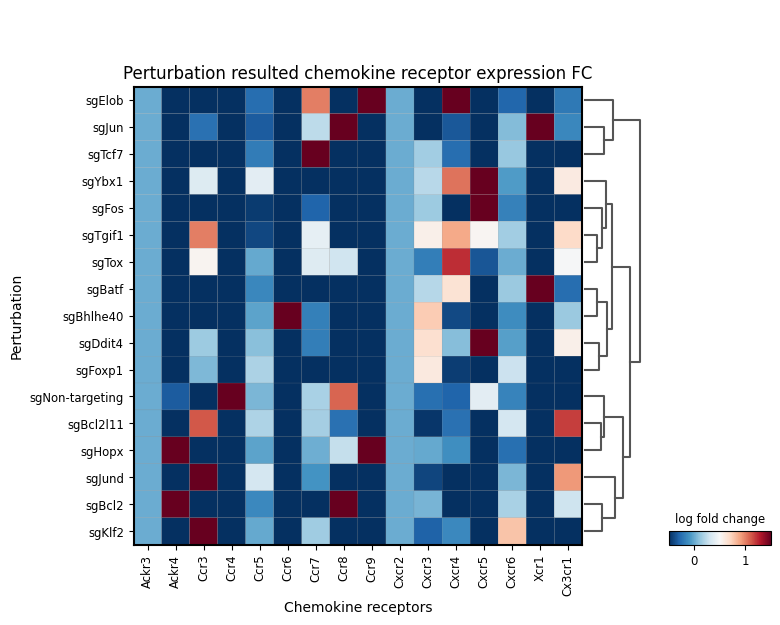

In [24]:
ax = sc.pl.rank_genes_groups_matrixplot(tf_data, cmap='RdBu_r',
    values_to_plot='logfoldchanges', groups=[gene for gene in tf_data.obs.perturb_gene.unique() if gene != 'sgNon-targeting'],
    var_names=np.array(gsea_chemokine_rc)[np.isin(gsea_chemokine_rc, scdata.var_names.tolist())],
    vmin=-0.5, vmax=1.5, return_fig=True)
ax.get_axes()['mainplot_ax'].set_title('Perturbation resulted chemokine receptor expression FC')
ax.get_axes()['mainplot_ax'].set_xlabel('Chemokine receptors')
ax.get_axes()['mainplot_ax'].set_ylabel('Perturbation')

<Figure size 1600x500 with 0 Axes>

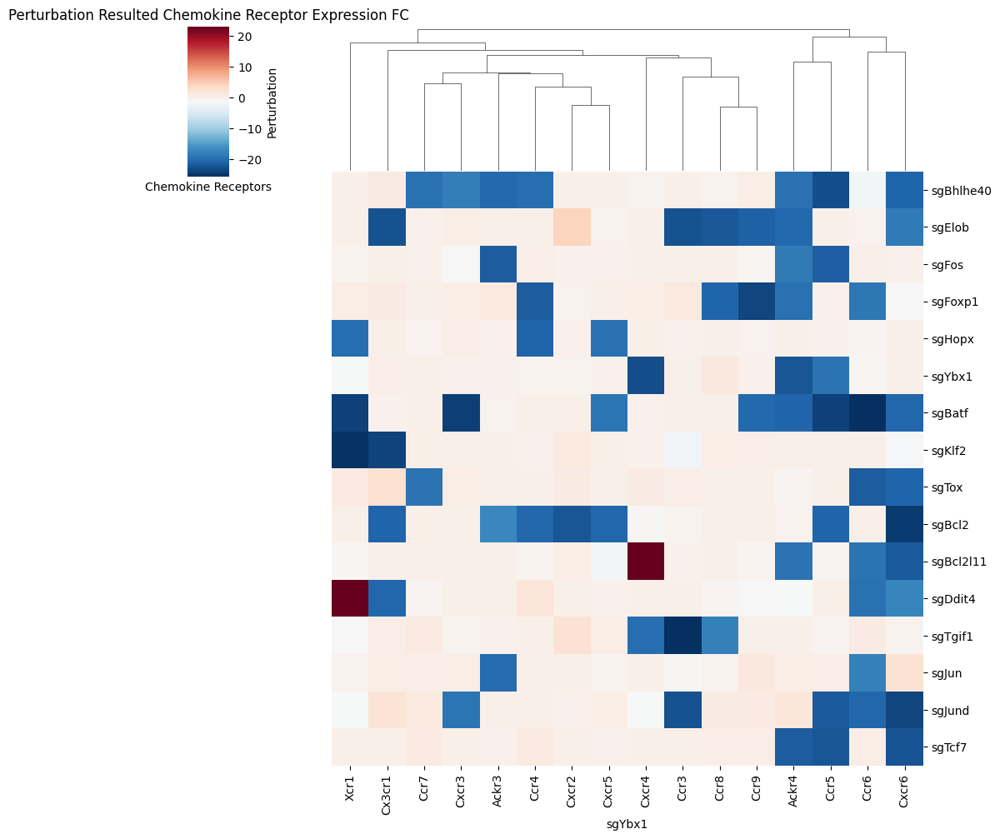

In [25]:
genes_to_plot = np.array(gsea_chemokine_rc)[np.isin(gsea_chemokine_rc, scdata.var_names.tolist())]
logfoldchanges = tf_data.uns['rank_genes_groups']['logfoldchanges']

df = pd.DataFrame(logfoldchanges)
n_df = pd.DataFrame(tf_data.uns['rank_genes_groups']['names'])
df.index = n_df['sgYbx1'].sort_values()
n_df.index = n_df['sgYbx1'].sort_values()
for columns in df.columns:
    df[columns] = df[columns][n_df[columns]].tolist()

# df = pd.DataFrame(logfoldchanges, columns=tf_data.obs['perturb_gene'].unique(), index=scdata.var_names)
df = df.loc[genes_to_plot, df.columns != 'sgNon-targeting']

plt.figure(figsize=(16, 5))
df = df.loc[:, ['sgBhlhe40', 'sgElob', 'sgFos', 'sgFoxp1', 'sgHopx', 'sgYbx1', 'sgBatf', 'sgKlf2', 'sgTox',
             'sgBcl2', 'sgBcl2l11', 'sgDdit4', 'sgTgif1', 'sgJun', 'sgJund', 'sgTcf7']]
l = df.loc['Cxcr4', 'sgBhlhe40']
# df.clip(-l, l, inplace=True)
graph = sns.clustermap(df.T, cmap='RdBu_r', annot=False, row_cluster=False)

plt.title('Perturbation Resulted Chemokine Receptor Expression FC')
plt.xlabel('Chemokine Receptors')
plt.ylabel('Perturbation')

plt.show()

Cxcr5
Cxcr4
Ackr4
Ccr7
Ccr4
Cxcr3
Ccr6
Cxcr6
Ackr3
Xcr1
Ccr5
Ccr3
Ccr9
Ccr8
Cx3cr1
Cxcr2


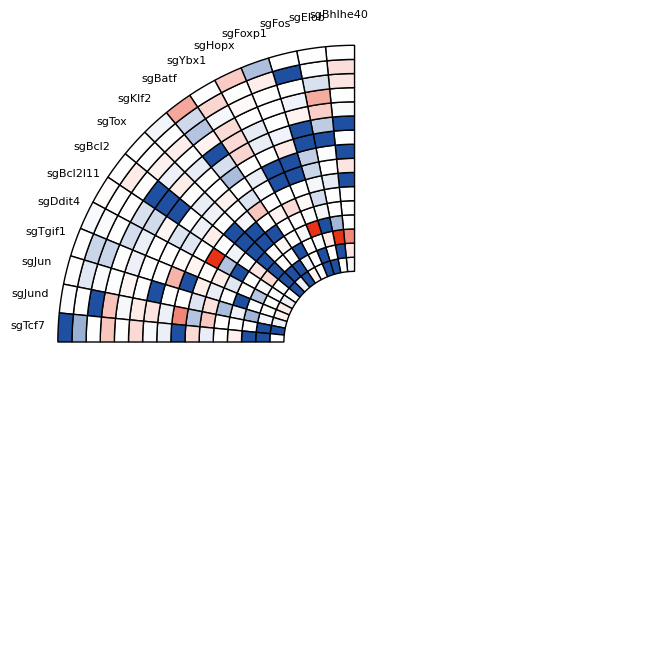

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), subplot_kw={'projection': 'polar'})
# cmap = plt.colormaps['RdBu_r']
cmap = new_cmap

# sorted_guides = df.columns[np.argsort(df.iloc[:, 4].values)[::-1]]
# sorted_guides = ['sgBhlhe40', 'sgTox', 'sgBcl2', 'sgFoxp1', 'sgKlf2', 'sgFos', 'sgHopx', 'sgJun', 'sgJund', 
#                 'sgBatf', 'sgDdit4', 'sgTgif1', 'sgBcl2l11', 'sgYbx1', 'sgElob']
sorted_guides = ['sgBhlhe40', 'sgElob', 'sgFos', 'sgFoxp1', 'sgHopx', 'sgYbx1', 'sgBatf', 'sgKlf2', 'sgTox',
                 'sgBcl2', 'sgBcl2l11', 'sgDdit4', 'sgTgif1', 'sgJun', 'sgJund', 'sgTcf7']
cdf = df.iloc[graph.dendrogram_col.reordered_ind]

min_val = -5
max_val = 5

cdf = cdf.clip(min_val, max_val)

radius = 1
width = 0.2

angle = 0.5 * np.pi / len(sorted_guides)
angles = np.linspace(0.5 * np.pi + angle / 2, 1 * np.pi + angle / 2, len(sorted_guides), endpoint=False)

for cluster in ['None'] * 0 + list(cdf.index):
    if cluster != 'None':
        guide_colors = cmap(((cdf.loc[cluster, sorted_guides].values - min_val) / (max_val - min_val)))
        bars = ax.bar(x=angles, height=width, width=angle, color=guide_colors, edgecolor='black', bottom=radius, alpha=1)  # 添加黑色网框
    else: 
        bars = ax.bar(x=angles, height=width, width=angle, color='none', edgecolor='black', bottom=radius)  # 添加黑色网框
    radius = radius + width
for cluster in list(cdf.index)[::-1]:
    print(cluster)

ax.spines['polar'].set_visible(False)  # 去除边框
ax.set_xticks(angles)
ax.set_xticklabels(sorted_guides, rotation=0, ha='center', fontsize=8)
ax.set_yticks([])
ax.grid(False)  # 去除grid线

plt.rcParams['pdf.fonttype']=42
plt.savefig("/home/wpy/stereoseq/20240702-Exclusive/plots/sgTF_chemokine_radar.pdf", format="pdf", bbox_inches='tight')
plt.show()

Cxcr5
Cxcr4
Ccr5
Ackr4
Cxcr6
Ccr9
Ccr7
Ccr3
Xcr1
Cxcr2
Cxcr3
Ccr6
Ackr3
Cx3cr1
Ccr8
Ccr4


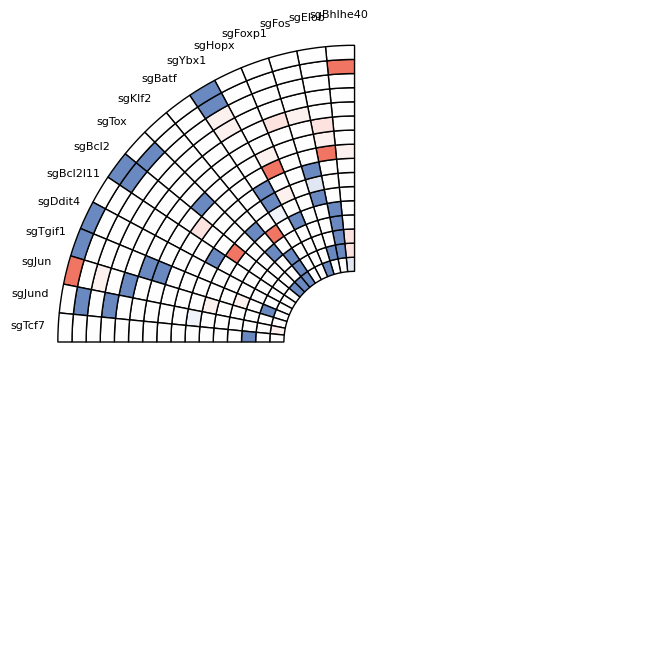

In [56]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), subplot_kw={'projection': 'polar'})
# cmap = plt.colormaps['RdBu_r']
cmap = new_cmap

# sorted_guides = df.columns[np.argsort(df.iloc[:, 4].values)[::-1]]
# sorted_guides = ['sgBhlhe40', 'sgTox', 'sgBcl2', 'sgFoxp1', 'sgKlf2', 'sgFos', 'sgHopx', 'sgJun', 'sgJund', 
#                 'sgBatf', 'sgDdit4', 'sgTgif1', 'sgBcl2l11', 'sgYbx1', 'sgElob']
sorted_guides = ['sgBhlhe40', 'sgElob', 'sgFos', 'sgFoxp1', 'sgHopx', 'sgYbx1', 'sgBatf', 'sgKlf2', 'sgTox',
                 'sgBcl2', 'sgBcl2l11', 'sgDdit4', 'sgTgif1', 'sgJun', 'sgJund', 'sgTcf7']
cdf = df.iloc[graph.dendrogram_col.reordered_ind]

min_val = -1.5
max_val = 1.5

cdf = cdf.clip(min_val, max_val)

radius = 1
width = 0.2

angle = 0.5 * np.pi / len(sorted_guides)
angles = np.linspace(0.5 * np.pi + angle / 2, 1 * np.pi + angle / 2, len(sorted_guides), endpoint=False)

for cluster in ['None'] * 0 + list(cdf.index):
    if cluster != 'None':
        guide_colors = cmap(((cdf.loc[cluster, sorted_guides].values - min_val) / (max_val - min_val)))
        bars = ax.bar(x=angles, height=width, width=angle, color=guide_colors, edgecolor='black', bottom=radius, alpha=1)  # 添加黑色网框
    else: 
        bars = ax.bar(x=angles, height=width, width=angle, color='none', edgecolor='black', bottom=radius)  # 添加黑色网框
    radius = radius + width
for cluster in list(cdf.index)[::-1]:
    print(cluster)

ax.spines['polar'].set_visible(False)  # 去除边框
ax.set_xticks(angles)
ax.set_xticklabels(sorted_guides, rotation=0, ha='center', fontsize=8)
ax.set_yticks([])
ax.grid(False)  # 去除grid线

plt.rcParams['pdf.fonttype']=42
plt.savefig("/home/wpy/stereoseq/20240702-Exclusive/plots/sgTF_chemokine_radar.pdf", format="pdf", bbox_inches='tight')
plt.show()

Text(0, 0.5, 'Perturbation')

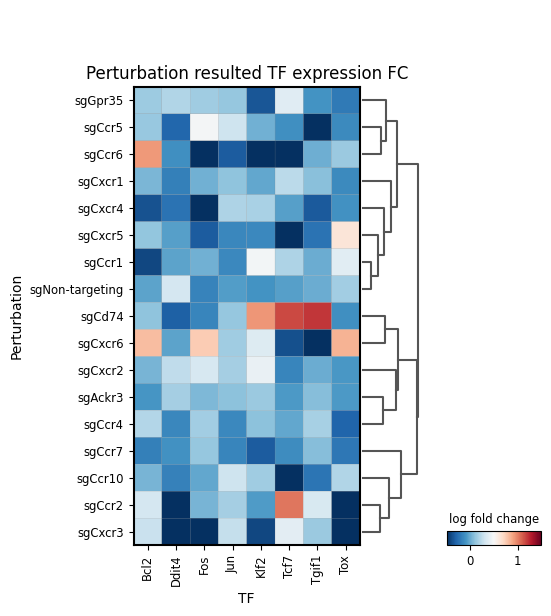

In [28]:
sc.tl.rank_genes_groups(ch_data, groupby='perturb_gene', method='t-test')
ax = sc.pl.rank_genes_groups_matrixplot(ch_data, cmap='RdBu_r',
    values_to_plot='logfoldchanges',
    var_names=np.intersect1d([st.lstrip('sg') for st in tf_data.obs.perturb_gene.unique() if st not in ['sgNon-targeting', 'Duplicate']], scdata.var_names),
    vmin=-0.5, vmax=1.5, return_fig=True)
ax.get_axes()['mainplot_ax'].set_title('Perturbation resulted TF expression FC')
ax.get_axes()['mainplot_ax'].set_xlabel('TF')
ax.get_axes()['mainplot_ax'].set_ylabel('Perturbation')

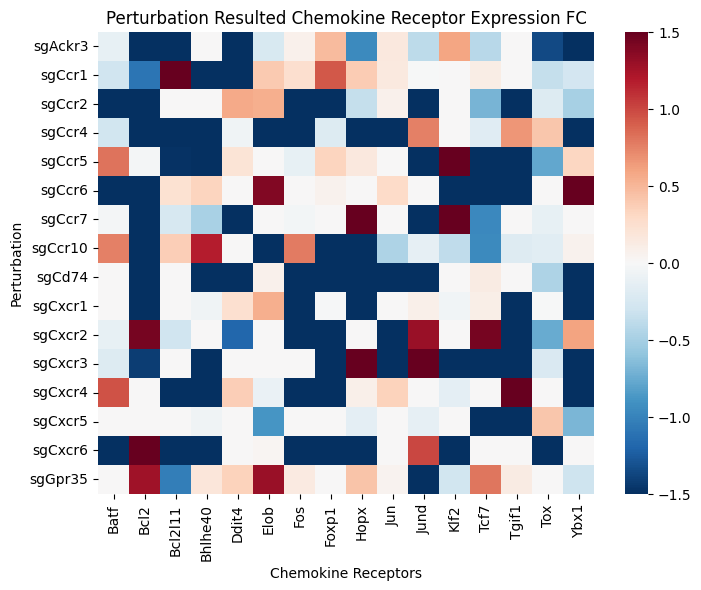

In [44]:
genes_to_plot = np.intersect1d([st.lstrip('sg') for st in tf_data.obs.perturb_gene.unique() if st not in ['sgNon-targeting', 'Duplicate']], scdata.var_names)
logfoldchanges = ch_data.uns['rank_genes_groups']['logfoldchanges']

df = pd.DataFrame(logfoldchanges)
n_df = pd.DataFrame(ch_data.uns['rank_genes_groups']['names'])
df.index = n_df['sgCcr4'].sort_values()
n_df.index = n_df['sgCcr4'].sort_values()
for columns in df.columns:
    df[columns] = df[columns][n_df[columns]].tolist()
df = df.loc[genes_to_plot, df.columns != 'sgNon-targeting']

plt.figure(figsize=(8, 6))
sns.heatmap(df.T, cmap='RdBu_r', vmin=-1.5, vmax=1.5, annot=False)

plt.title('Perturbation Resulted Chemokine Receptor Expression FC')
plt.xlabel('Chemokine Receptors')
plt.ylabel('Perturbation')

plt.show()

In [48]:
max_val

3.212193489074707

In [34]:
sc.tl.rank_genes_groups(ch_data, groupby='perturb_gene', method='t-test', reference='sgNon-targeting')

Tgif1
Ddit4
Foxp1
Fos
Jund
Klf2
Bcl2
Ybx1
Bcl2l11
Elob
Batf
Tcf7
Jun
Tox
Hopx
Bhlhe40


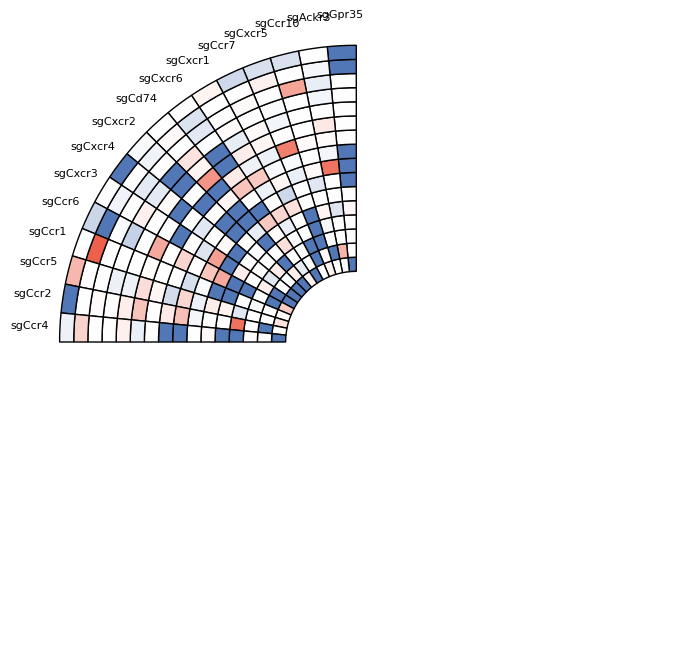

In [35]:
genes_to_plot = np.intersect1d([st.lstrip('sg') for st in tf_data.obs.perturb_gene.unique() if st not in ['sgNon-targeting', 'Duplicate']], scdata.var_names)
logfoldchanges = ch_data.uns['rank_genes_groups']['logfoldchanges']

df = pd.DataFrame(logfoldchanges)
n_df = pd.DataFrame(ch_data.uns['rank_genes_groups']['names'])
df.index = n_df['sgCcr4'].sort_values()
n_df.index = n_df['sgCcr4'].sort_values()
for columns in df.columns:
    df[columns] = df[columns][n_df[columns]].tolist()
df = df.loc[genes_to_plot, df.columns != 'sgNon-targeting']

fig, ax = plt.subplots(1, 1, figsize=(8, 8), subplot_kw={'projection': 'polar'})
# cmap = plt.colormaps['RdBu_r']
cmap = new_cmap

# sorted_guides = df.columns[np.argsort(df.iloc[:, 4].values)[::-1]]
sorted_guides = ['sgGpr35', 'sgAckr3', 'sgCcr10', 'sgCxcr5', 'sgCcr7', 'sgCxcr1', 'sgCxcr6', 'sgCd74', 'sgCxcr2', 'sgCxcr4', 'sgCxcr3', 'sgCcr6', 'sgCcr1', 'sgCcr5', 'sgCcr2', 'sgCcr4']
# sorted_guides = df.columns[np.argsort(df.iloc[:, 4].values)[::-1]]

index = sns.clustermap(df, cmap='RdBu_r', vmin=-4, vmax=4, annot=False, col_cluster=False).dendrogram_row.reordered_ind
plt.close()

min_val = -4
max_val = 4

df.clip(min_val, max_val, inplace=True)

radius = 1
width = 0.2

angle = 0.5 * np.pi / len(df.index)
angles = np.linspace(0.5 * np.pi + angle / 2, 1 * np.pi + angle / 2, len(df.index), endpoint=False)

for cluster in ['None'] * 0 + list(df.iloc[index].index):
    if cluster != 'None':
        guide_colors = cmap(((df.loc[cluster, sorted_guides].values - min_val * 1.3) / (max_val * 1.3 - min_val * 1.3)))
        bars = ax.bar(x=angles, height=width, width=angle, color=guide_colors, edgecolor='black', bottom=radius, alpha=1)  # 添加黑色网框
    else: 
        bars = ax.bar(x=angles, height=width, width=angle, color='none', edgecolor='black', bottom=radius)  # 添加黑色网框
    radius = radius + width

ax.spines['polar'].set_visible(False)  # 去除边框
ax.set_xticks(angles, sorted_guides, rotation=0, ha='center', fontsize=8)
# ax.set_yticks([width, 2*width])
# ax.set_yticklabels([f'{width}', f'{2*width}'], rotation=0, ha='right', fontsize=8)  # 设置yticks位置为竖直排布
ax.set_yticks([])
ax.grid(False)  # 去除grid线

for cluster in list(df.iloc[index].index)[::-1]:
    print(cluster)

# plt.xlim([0.5 * np.pi, 2 * np.pi])
# plt.ylim([0, 1])
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/sgCR_tf_radar_without_dup.pdf", format="pdf", bbox_inches='tight')
plt.show()

# TF <-> Phenotype

In [10]:
chemokine_list = ["sgCcr1", "sgCcr2", "sgCcr4", "sgCcr5", "sgCcr6",
    "sgCcr7", "sgCcr10", "sgCxcr1", "sgCxcr2", "sgCxcr3", "sgCxcr4",
    "sgAckr3", "sgCxcr5", "sgCxcr6", "sgCd74", "sgGpr35"]
tf_data = scdata[~np.isin(scdata.obs.perturb_gene, chemokine_list)].copy()

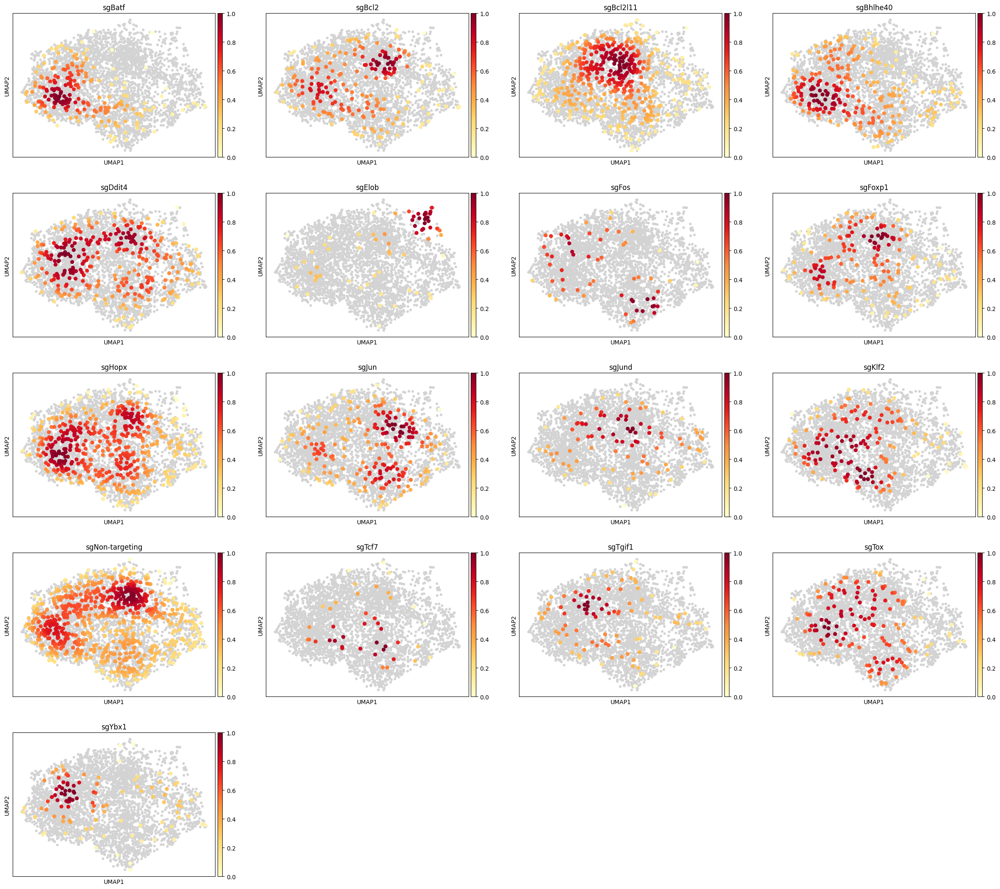

In [113]:
sc.pl.embedding_density(tf_data, basis='umap', key='umap_density_perturb_gene')

/tmp/ipykernel_59679/3342638479.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Text(0.5, 1.0, 'Proportion of T subtype')

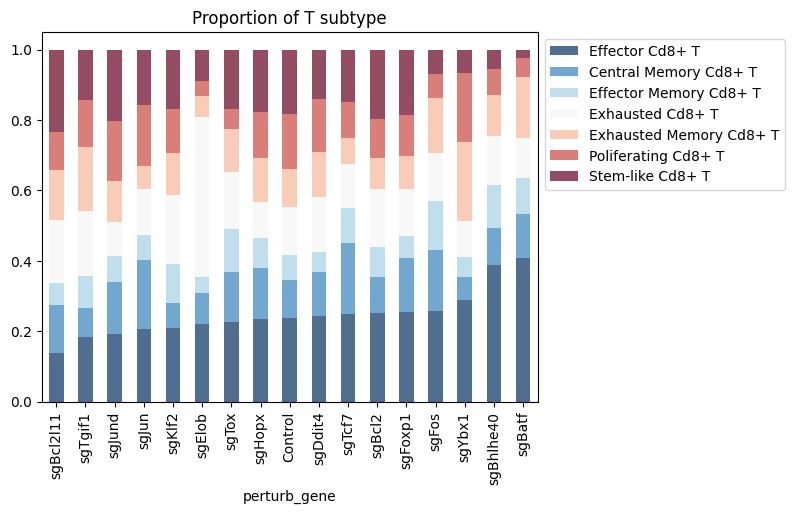

In [115]:
cdf = tf_data.obs.groupby('perturb_gene')['leiden'].value_counts().unstack()
cdf = cdf.divide(cdf.sum(axis=1), axis=0)
cdf = cdf[['Effector Cd8+ T'] + list(cdf.columns[cdf.columns != 'Effector Cd8+ T'])]
cdf.index = cdf.index.str.replace('sgNon-targeting', 'Control')
cdf.sort_values(by='Effector Cd8+ T', inplace=True)

cdf.plot(kind='bar', stacked=True, colormap='RdBu_r', alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.title('Proportion of T subtype')

In [11]:
import plotly.graph_objects as go

# 示例数据
data = tf_data.obs[["perturb_gene", "leiden"]]
data.columns = ["perturb_gene", "cluster"]

df = pd.DataFrame(data)

# 计算流量值（在这里，每个组合的频率）
flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')

# 创建源、目标和值的列表
source_indices = []
target_indices = []
values = []

# 获取唯一的perturb_gene和cluster
unique_genes = flows['perturb_gene'].unique()
unique_clusters = flows['cluster'].unique()

# 创建索引映射
gene_indices = {gene: idx for idx, gene in enumerate(unique_genes)}
cluster_indices = {cluster: idx + len(unique_genes) for idx, cluster in enumerate(unique_clusters)}

# 构建源、目标和值列表
for index, row in flows.iterrows():
    source_indices.append(gene_indices[row['perturb_gene']])
    target_indices.append(cluster_indices[row['cluster']])
    values.append(row['count'])

# 计算每个perturb_gene的流量总和
total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()

# 计算每个perturb_gene的流量占比
flows['total_gene_flow'] = flows['perturb_gene'].map(total_flows_per_gene)
flows.total_gene_flow = flows.total_gene_flow.astype(int)
flows['color_intensity'] = flows['count'] / flows['total_gene_flow']

# 创建颜色映射
import matplotlib.cm as cm
colors = [cm.RdBu_r(2.5*x) for x in flows['color_intensity']]
    
# 创建Sankey图
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_genes) + list(unique_clusters),
        color="Orange"
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values,
        color=[f"rgba({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)}, 0.7)" for color in colors],
    )
)])

# 更新布局
fig.update_layout(title_text="Sankey Diagram of perturb_gene to cluster", font_size=10)
fig.update_layout(
    width=600,  # 设置宽度
    height=1200,  # 设置高度
)
fig.show()

/tmp/ipykernel_9146/1350086214.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  flows = df.groupby(['perturb_gene', 'cluster']).size().reset_index(name='count')
/tmp/ipykernel_9146/1350086214.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_flows_per_gene = flows.groupby('perturb_gene')['count'].sum()


In [74]:
flows.to_csv('./flows.csv', index=False)

In [73]:
from d3blocks import D3Blocks

d3 = D3Blocks(chart='Chord', frame=False)

flows['source'] = flows['perturb_gene']
flows['target'] = flows['cluster']
flows['weight'] = flows['color_intensity']

d3 = D3Blocks(chart='Chord', frame=False)
d3.chord(flows[['source', 'target', 'weight']], notebook=True)
d3.show()

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Node properties are set.
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/d3blocks/utils.py:606: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

[d3blocks] >INFO> Set edge-opacity based on the [source] node-opacity.
[d3blocks] >INFO> Set edge-colors based on the [sourc

[d3blocks] >INFO> File already exists and will be overwritten: [/tmp/d3blocks/chord.html]
[d3blocks] >INFO> Display in notebook using IPython.
